# Exploration Dat Analysis (EDA)

In [1]:
import pandas as pd
from collections import Counter
from wordcloud import WordCloud
from config import final_dfTrain, final_dfTest, ceas, nazario, nigerian_fraud, spam_assasin
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

In [2]:
pd.set_option('display.max_columns', None) # Show all columns
pd.set_option('display.width', None) # Auto-detect terminal width
pd.set_option('display.max_colwidth', None) # Show full column content
pd.set_option('display.max_rows', 100)

dfTrain = pd.read_csv(final_dfTrain)
dfTest = pd.read_csv(final_dfTest)

### Here is a simple and brief, yet comprehensive statistical exploration of the training and testing datasets.

In [3]:
print('-------------Info Train: -------------\n')
dfTrain.info()


-------------Info Train: -------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35995 entries, 0 to 35994
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   text_length        35995 non-null  int64  
 1   caps_ratio         35995 non-null  float64
 2   exclamation_ratio  35995 non-null  float64
 3   question_ratio     35995 non-null  float64
 4   has_money          35995 non-null  int64  
 5   digits_ratio       35995 non-null  float64
 6   email_phone        35995 non-null  int64  
 7   day_of_week        35995 non-null  int64  
 8   hour               35995 non-null  int64  
 9   urls               35995 non-null  int64  
 10  label              35995 non-null  int64  
 11  source             35995 non-null  object 
 12  cleaned_text       35995 non-null  object 
dtypes: float64(4), int64(7), object(2)
memory usage: 3.6+ MB


In [4]:
print('-------------Describe Train: -------------\n')
dfTrain.describe()

-------------Describe Train: -------------



,text_length,caps_ratio,exclamation_ratio,question_ratio,has_money,digits_ratio,email_phone,day_of_week,hour,urls,label
count,3.599500e+04,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000,35995.000000
mean,1.809831e+03,0.059363,0.001912,0.000946,0.161967,0.025567,0.407001,2.492957,9.925573,0.651285,0.525629
std,2.523137e+04,0.081708,0.005378,0.002555,0.368426,0.036696,0.491282,1.375079,7.134792,0.476570,0.499350
min,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,0.000000
25%,2.860000e+02,0.024330,0.000000,0.000000,0.000000,0.002160,0.000000,2.000000,4.000000,0.000000,0.000000
50%,6.680000e+02,0.038462,0.000000,0.000000,0.000000,0.013612,0.000000,3.000000,10.000000,1.000000,1.000000
75%,1.716000e+03,0.063957,0.001040,0.001193,0.000000,0.034909,1.000000,3.000000,16.000000,1.000000,1.000000
max,4.599644e+06,0.923077,0.142857,0.289086,1.000000,1.000000,1.000000,6.000000,23.000000,1.000000,1.000000


In [5]:
print('-------------Info Test: -------------\n')
dfTest.info()

-------------Info Test: -------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9152 entries, 0 to 9151
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   text_length        9152 non-null   int64  
 1   caps_ratio         9152 non-null   float64
 2   exclamation_ratio  9152 non-null   float64
 3   question_ratio     9152 non-null   float64
 4   has_money          9152 non-null   int64  
 5   digits_ratio       9152 non-null   float64
 6   email_phone        9152 non-null   int64  
 7   day_of_week        9152 non-null   int64  
 8   hour               9152 non-null   int64  
 9   urls               9152 non-null   int64  
 10  label              9152 non-null   int64  
 11  source             9152 non-null   object 
 12  cleaned_text       9152 non-null   object 
dtypes: float64(4), int64(7), object(2)
memory usage: 929.6+ KB


In [6]:
print('-------------Describe Test: -------------\n')
dfTest.describe()

-------------Describe Test: -------------



,text_length,caps_ratio,exclamation_ratio,question_ratio,has_money,digits_ratio,email_phone,day_of_week,hour,urls,label
count,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000,9152.000000
mean,1586.914445,0.058256,0.002018,0.000910,0.157343,0.024996,0.393575,2.485140,9.887893,0.655704,0.532780
std,4170.672195,0.077152,0.005534,0.001971,0.364143,0.035582,0.488569,1.368901,7.099285,0.475164,0.498952
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.000000,0.000000
25%,262.750000,0.023850,0.000000,0.000000,0.000000,0.001605,0.000000,2.000000,4.000000,0.000000,0.000000
50%,641.000000,0.038462,0.000000,0.000000,0.000000,0.013575,0.000000,2.000000,10.000000,1.000000,1.000000
75%,1618.000000,0.064516,0.001121,0.001122,0.000000,0.034161,1.000000,3.000000,15.000000,1.000000,1.000000
max,194719.000000,0.862069,0.093750,0.041667,1.000000,0.619048,1.000000,6.000000,23.000000,1.000000,1.000000


### Profile Report

For a more detailed yet general exploration of the datasets, the Profile Report of the ydata-profiling library follows. With the Profile Report, we have the ability to quickly explore a dataset, allowing us to constantly refer back to it while implementing the core preprocessing code or even during the modeling stage. Subsequently, depending on the findings from this iterative process, a more specific exploratory analysis will be carried out based on the issues and questions that arise.

In [3]:
dfTrainProfile = ProfileReport(dfTrain, title="Training Set Profiling Report", explorative=True)
dfTrainProfile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:11<00:00,  1.09it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
dfTestProfile = ProfileReport(dfTest, title="Test Set Profiling Report", explorative=True)
dfTestProfile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:03<00:00,  3.47it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Most Frequent Words of the Two Classes

An investigation follows regarding the most frequent words appearing in spam and regular (ham) messages. It is important to know which words appear most in each category so that we can evaluate the machine learning models that will follow, as well as interpret their results.

C:\Users\geo98\AppData\Local\Temp\ipykernel_8976\1035852733.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts), y=list(words_), palette='viridis')


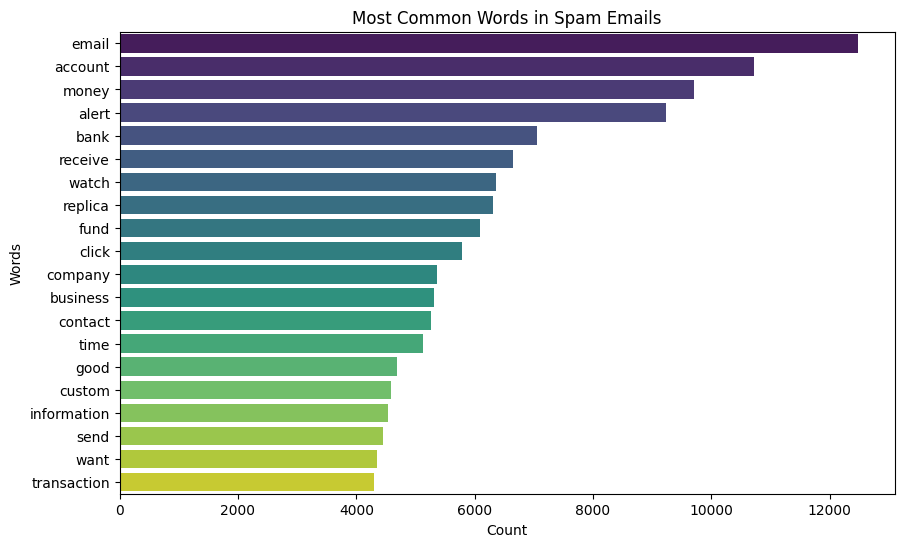

C:\Users\geo98\AppData\Local\Temp\ipykernel_8976\1035852733.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts), y=list(words_), palette='viridis')


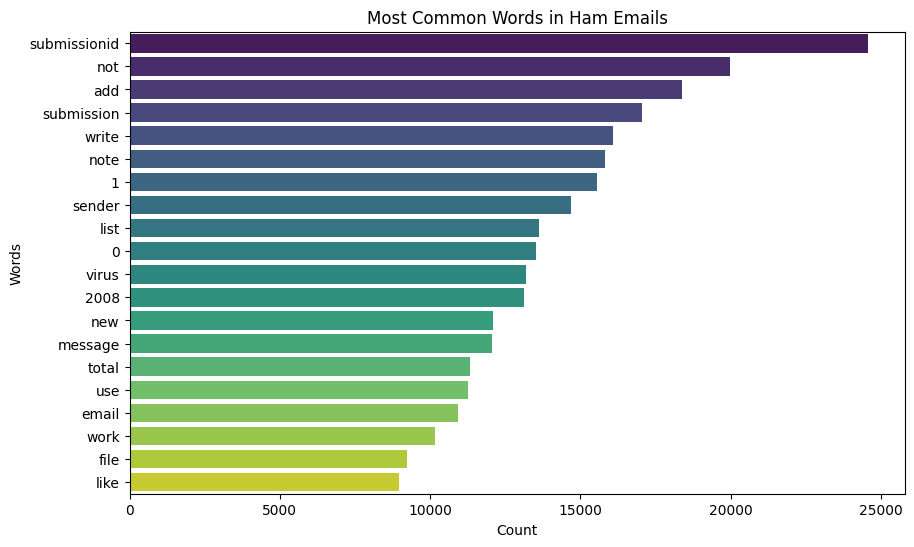

In [9]:
# Most frequent words in spam and ham emails
%matplotlib inline
spam_words = ' '.join(list(dfTrain[dfTrain['label'] == 1]['cleaned_text']))
ham_words = ' '.join(list(dfTrain[dfTrain['label'] == 0]['cleaned_text']))

def plot_most_common_words(word_string, label):
    words = word_string.split()
    # remove the token 'url' if present
    words = [w for w in words if w != 'url']
    word_counts = Counter(words)
    most_common = word_counts.most_common(20)
    if not most_common:
        print(f'No words to display for {label}')
        return
    words_, counts = zip(*most_common)
    
    plt.figure(figsize=(10,6))
    sns.barplot(x=list(counts), y=list(words_), palette='viridis')
    plt.title(f'Most Common Words in {label} Emails')
    plt.xlabel('Count')
    plt.ylabel('Words')
    plt.show()

plot_most_common_words(spam_words, 'Spam')
plot_most_common_words(ham_words, 'Ham')

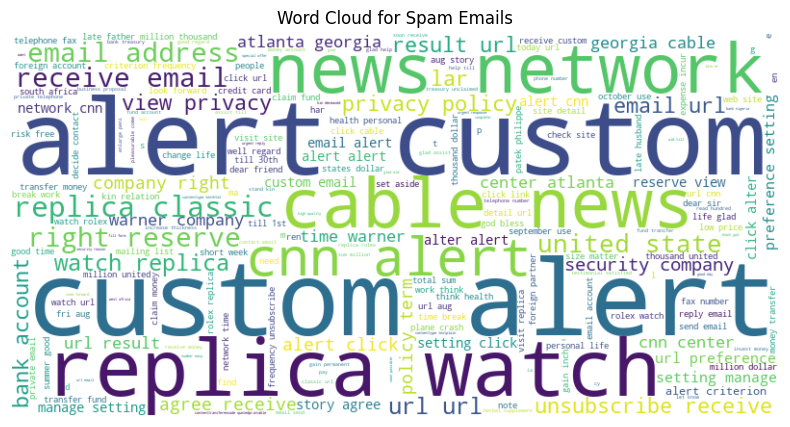

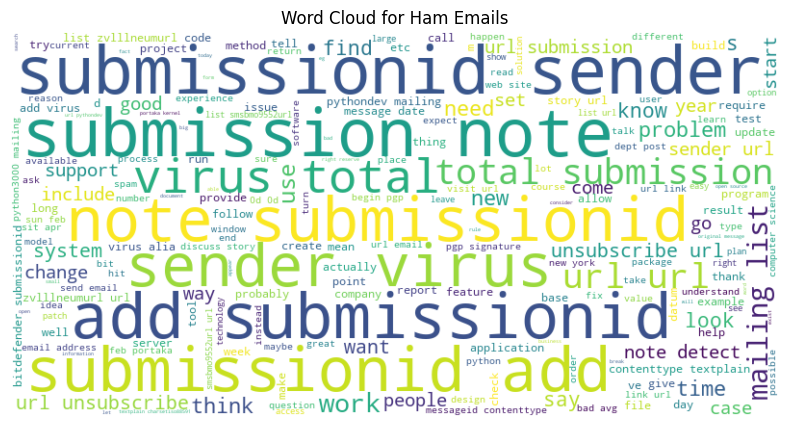

In [10]:
# Word Cloud for Spam and Ham Emails
%matplotlib inline
def plot_wordcloud(word_string, label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(word_string)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {label} Emails')
    plt.axis('off')
    plt.show()

plot_wordcloud(spam_words, 'Spam')
plot_wordcloud(ham_words, 'Ham')

### Analysis of Structural Features

Beyond the lexical content, we examine the structural features of the messages. We begin with the representation of the distributions of the numerical features.

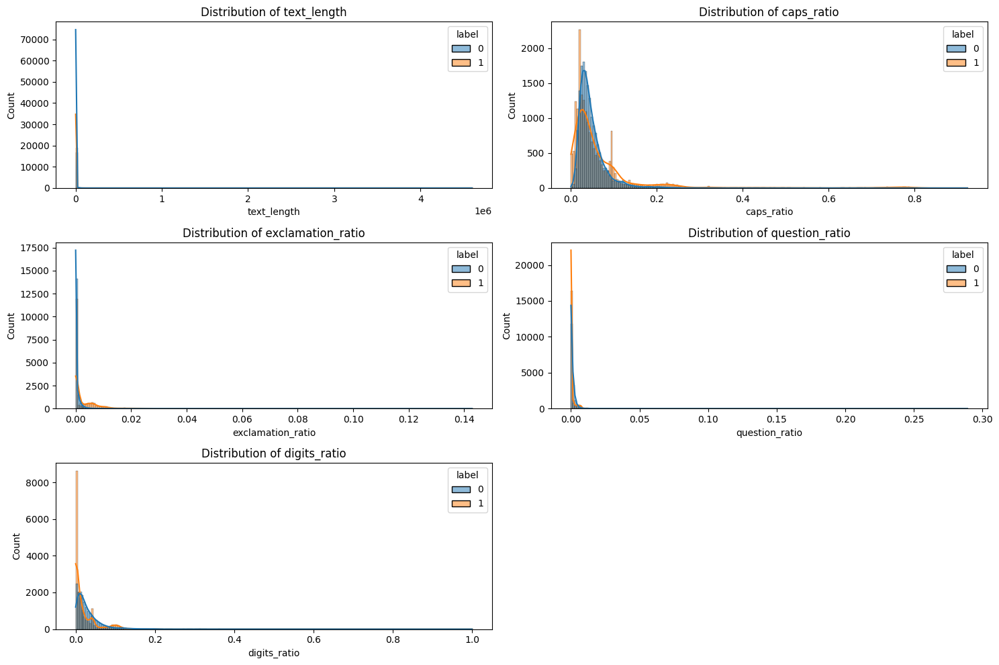

In [11]:
# Subplots with Distribution of Numerical Features
%matplotlib inline
numerical_features = ['text_length', 'caps_ratio', 'exclamation_ratio', 'question_ratio',  'digits_ratio']
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(3, 2, i)
    sns.histplot(data=dfTrain, x=feature, hue='label', kde=True, bins=200, stat='count')
    plt.title(f'Distribution of {feature}')

plt.tight_layout()
plt.show()

##### We observe that some features/columns, such as the length of the email or the number of exclamation marks, are not depicted correctly in the diagrams above. This occurs due to the presence of a few extreme values (outliers), which shift the distribution to the left. Below, we define the cut_outliers() function to study each column without the presence of outliers, without, however, deleting these values from our dataset, as they are useful for training and generalizing the model we will construct later in this project.

In [12]:
%matplotlib inline

def cut_outliers(col, threshold):
    print(dfTrain[dfTrain[f'{col}'] > threshold].head(10))

    filtered_df = dfTrain[dfTrain[f'{col}'] > threshold].copy()
    filtered_df['label'] = filtered_df['label'].map({0: 'Ham', 1: 'Spam'})

    plt.figure(figsize=(8, 5))
    sns.countplot(data=filtered_df, x='label', hue='label', palette='viridis', legend=True)
    plt.title(f'Number of emails with {col} > {threshold}')
    plt.ylabel('Count')
    plt.xlabel('Label')
    plt.show()



     text_length  caps_ratio  exclamation_ratio  question_ratio  has_money  \
93         20008    0.051879           0.000000        0.000000          1   
95         50469    0.122848           0.000040        0.000000          0   
119        29201    0.122085           0.000240        0.000000          0   
127        43669    0.037624           0.000069        0.000504          1   
131        27581    0.061274           0.000109        0.000399          1   
221        25297    0.058584           0.000356        0.000158          1   
262        21516    0.049405           0.000000        0.000000          1   
458        43434    0.121794           0.000138        0.000000          0   
504        33590    0.030396           0.000000        0.001876          1   
575        34093    0.075177           0.000059        0.003784          1   

     digits_ratio  email_phone  day_of_week  hour  urls  label        source  \
93       0.007947            1            1    22     0      

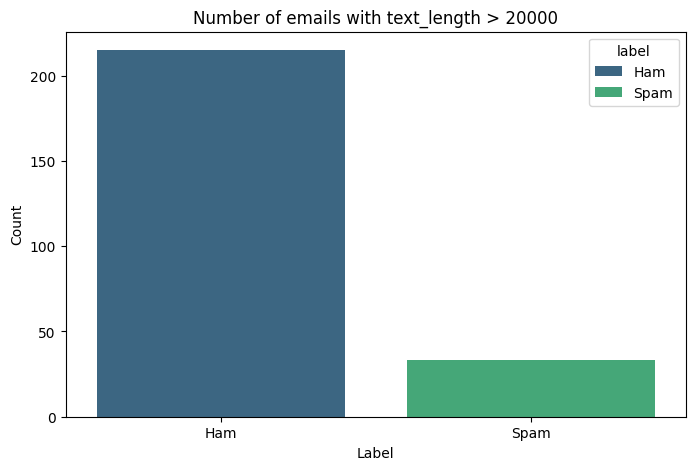

In [13]:
cut_outliers('text_length', 20000)

We observe that the number of messages with a length greater than 20,000 characters is quite small (~250-300 messages) compared to the entire dataset (40,000 messages). Thus, initially, we recreate the distribution of message lengths without the presence of outliers.

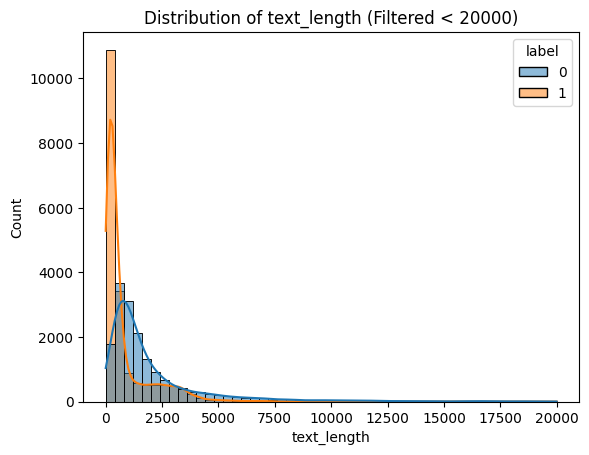

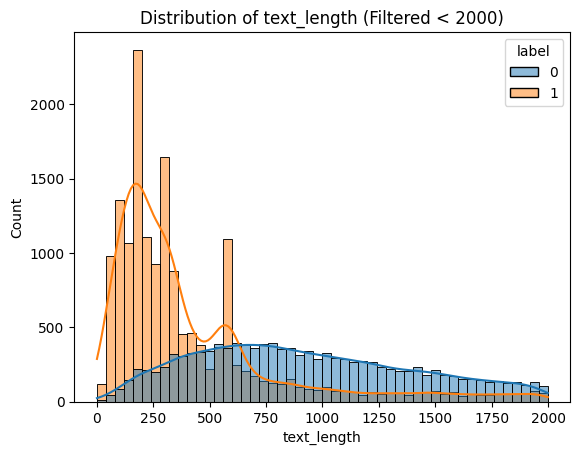

In [14]:
#we recreate the graph of distribution of text_length without the 'outliers' (we keep them, we just dont show them in the graph)

def plot_cut_outliers(col, threshold):
    sns.histplot(data=dfTrain[dfTrain[f'{col}'] < threshold], x=col, hue='label', bins=50, kde=True, stat='count')
    plt.title(f'Distribution of {col} (Filtered < {threshold})')
    plt.show()

plot_cut_outliers('text_length', 20000)

#let's zoom in even more
plot_cut_outliers('text_length', 2000)

**Comment**: Most spam messages have a shorter text length (about 150-200 characters) in contrast to regular ones, for which we observe that their distribution shifts further to the right. Specifically, the length of a regular message usually consists of about 1,000 characters, meaning they are five times larger than spam. Furthermore, the large outliers we removed to better represent the message length distribution belong mainly to regular messages. Therefore, short messages are mostly spam, while medium and larger messages are regular.

We will do the same for the remaining columns of interest:

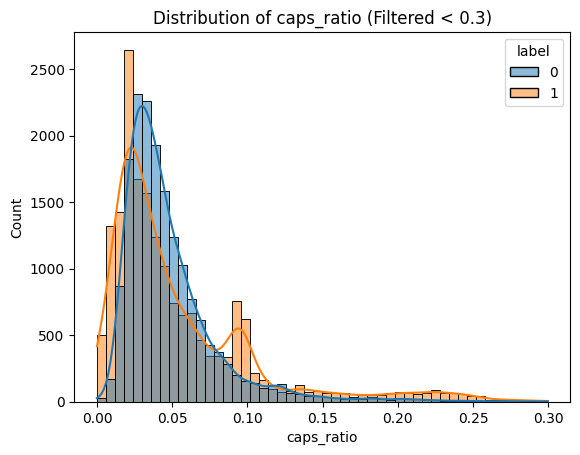

In [15]:
plot_cut_outliers('caps_ratio', 0.3)

**Comment**: The diagram above presents the number of messages in relation to the ratio of capital letters they contain. We observe that the two classes do not differ significantly from each other; however, starting from the peak shown at `caps_ratio = 0.09` and for higher values, the spam class dominates. Thus, we conclude that if a message has capital letters exceeding 9% of its characters, it is likely to be spam.

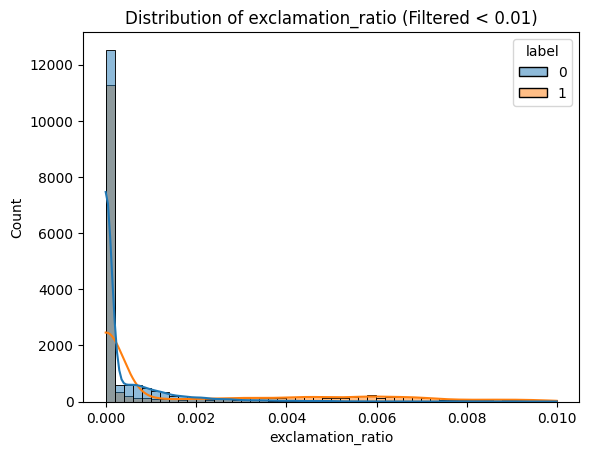

In [16]:
plot_cut_outliers('exclamation_ratio', 0.01)



In [17]:
#seperate the dataset in its classes
class0 = dfTrain[dfTrain['label'] == 0]
class1 = dfTrain[dfTrain['label'] == 1]

In [18]:
has_exclamation_class0 = class0[class0['exclamation_ratio'] > 0]['exclamation_ratio'].count()
no_exclamation_class0 = class0[class0['exclamation_ratio'] == 0]['exclamation_ratio'].count()
has_exclamation_class1 = class1[class1['exclamation_ratio'] > 0]['exclamation_ratio'].count()
no_exclamation_class1 = class1[class1['exclamation_ratio'] == 0]['exclamation_ratio'].count()

print('HAM mails with exclamation marks: ', has_exclamation_class0)
print('HAM mails WITHOUT exclamation marks: ', no_exclamation_class0)
print('SPAM mails with exclamation marks: ', has_exclamation_class1)
print('SPAM mails WITHOUT exclamation marks: ', no_exclamation_class1)

HAM mails with exclamation marks:  4899
HAM mails WITHOUT exclamation marks:  12176
SPAM mails with exclamation marks:  7696
SPAM mails WITHOUT exclamation marks:  11224


**Comment**: From the above, we conclude that the number of exclamation marks in a message is not correlated with its class as regular or spam.

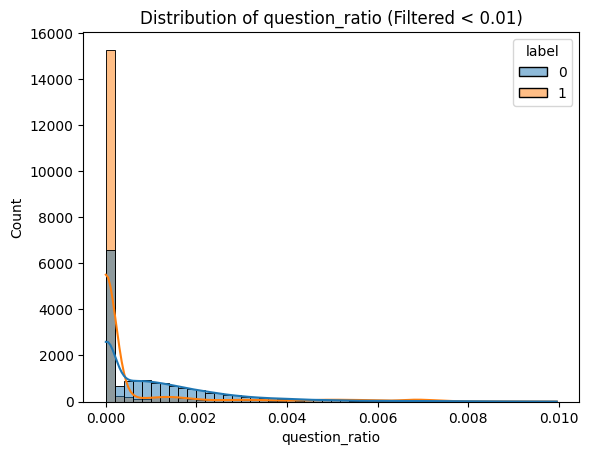

In [19]:
plot_cut_outliers('question_ratio', 0.01)

In [20]:
#lets examine this feature more
#ham mails with question marks
print('HAM mails with question marks', class0[class0['question_ratio'] >0]['question_ratio'].count())
print('HAM mails WITHOUT question marks', class0[class0['question_ratio'] ==0]['question_ratio'].count())

#spam mails with question marks
print('SPAM mails with question marks', class1[class1['question_ratio'] >0]['question_ratio'].count())
print('SPAM mails WITHOUT question marks', class1[class1['question_ratio'] ==0]['question_ratio'].count())

HAM mails with question marks 10689
HAM mails WITHOUT question marks 6386
SPAM mails with question marks 3693
SPAM mails WITHOUT question marks 15227


The number of question marks seems to correlate with the category of the message regarding whether it contains a question mark or not. We observe that spam messages likely do not contain question marks, and conversely, the presence of even one question mark is an indication of a regular message.

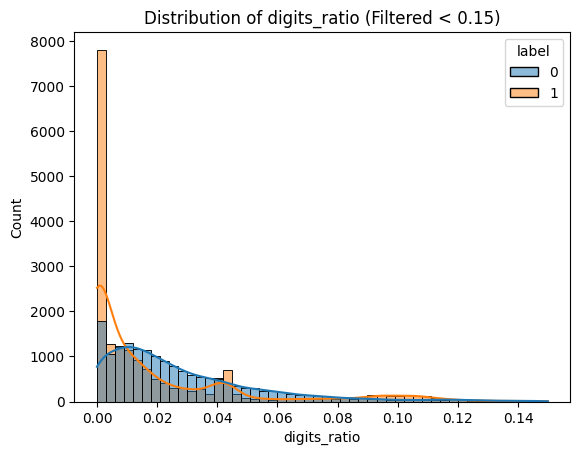

In [21]:
plot_cut_outliers('digits_ratio', 0.15)

In [22]:
#ham mails with digits
print('HAM mails with digits: ', class0[class0['digits_ratio'] >0]['digits_ratio'].count())
print('HAM mails WITHOUT digits: ', class0[class0['digits_ratio'] ==0]['digits_ratio'].count())

#spam mails with digits
print('SPAM mails with digits: ', class1[class1['digits_ratio'] >0]['digits_ratio'].count())
print('SPAM mails WITHOUT digits: ', class1[class1['digits_ratio'] ==0]['digits_ratio'].count())

HAM mails with digits:  15923
HAM mails WITHOUT digits:  1152
SPAM mails with digits:  11704
SPAM mails WITHOUT digits:  7216


**Comment**: From the counts, it appears that regular messages almost always contain a digit, whereas spam messages very often do not contain any digits at all.

Below, we investigate the number of classes present in each dataset before they are finally merged together into the ETL.py file.

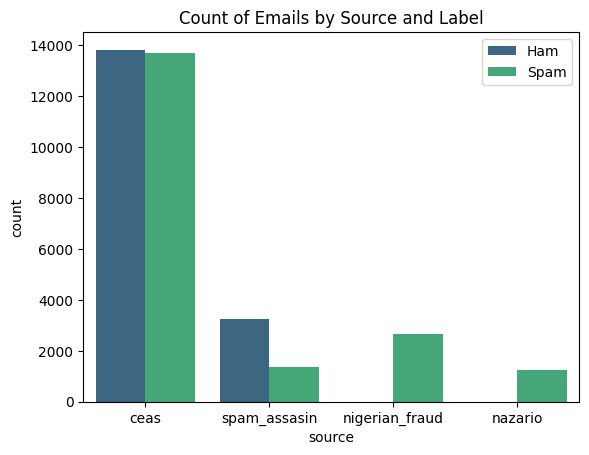

In [23]:
sns.countplot(data=dfTrain, x='source', hue='label', palette='viridis')
plt.title('Count of Emails by Source and Label')
plt.legend(['Ham', 'Spam'])
plt.show()

Next, we will examine the variables that take values of 0 or 1, namely `has_money`, `email_phone`, and `urls`.

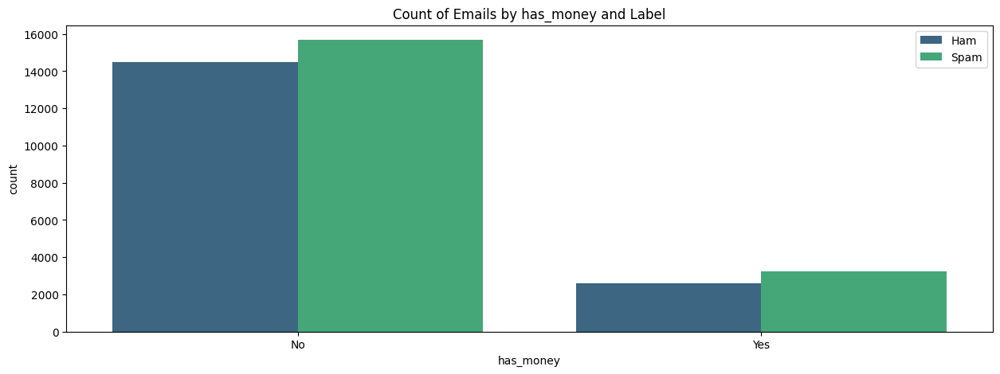

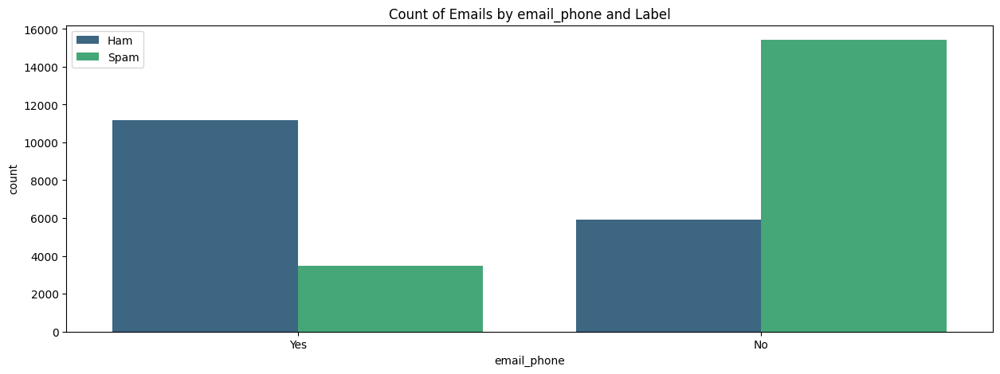

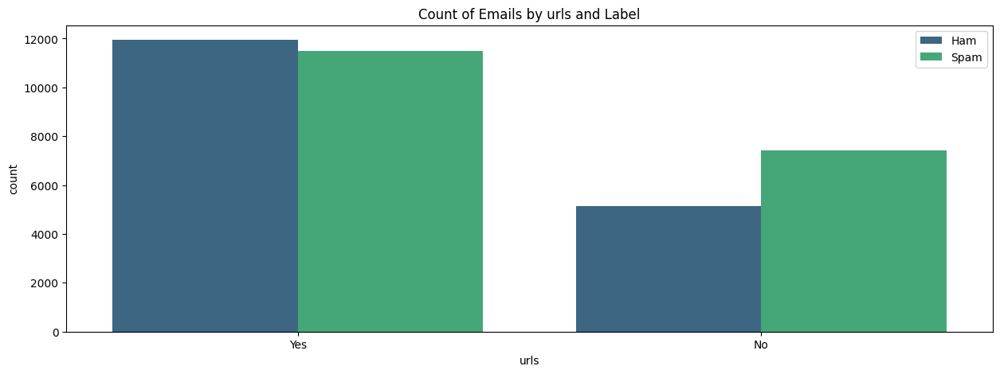

In [24]:
no_yes = {
    0: "No",
    1: "Yes"
}

for col in ['has_money', 'email_phone','urls']:
    plt.figure(figsize=(15, 5))
    sns.countplot(data=dfTrain, x=dfTrain[col].map(no_yes), hue='label', palette='viridis')
    plt.title(f'Count of Emails by {col} and Label')
    plt.legend(['Ham', 'Spam'])
    plt.show()

In [25]:
print('Ham no url: ', class0[class0['urls'] == 0]['urls'].count())
print('Ham has url: ', class0[class0['urls'] == 1]['urls'].count())

print('Spam no url: ', class1[class1['urls'] == 0]['urls'].count())
print('Spam has url: ', class1[class1['urls'] == 1]['urls'].count())


Ham no url:  5128
Ham has url:  11947
Spam no url:  7424
Spam has url:  11496


From the diagrams above, the features `email_phone` and `urls` appear to be correlated with the message class. Specifically, the presence of a phone number and/or an email address is an indication of a regular email, while containing neither is an indication of spam. The existence of a URL in the message has a weaker correlation; however, we observe that if there is no URL, there is a high probability that it is spam.

Although the above may seem paradoxical based on everyday experience, it is important to keep in mind the nature of this specific dataset.

In [26]:
ceas = pd.read_csv(ceas)
nazario = pd.read_csv(nazario)
nigerian_fraud = pd.read_csv(nigerian_fraud)
spam_assasin = pd.read_csv(spam_assasin)

dfs = {
    'ceas': ceas,
    'nazario': nazario,
    'nigerian_fraud': nigerian_fraud,
    'spam_assasin': spam_assasin
}

In [27]:
for name, df in dfs.items():

    df['date'] = pd.to_datetime(df['date'], utc=True, errors='coerce')

    min_year = df['date'].dt.year.min()
    max_year = df['date'].dt.year.max()

    print(f"Dataset {name} has messages from {min_year} to {max_year}")

Dataset ceas has messages from 1980.0 to 2100.0
Dataset nazario has messages from 2015.0 to 2022.0
Dataset nigerian_fraud has messages from 1980.0 to 2082.0
Dataset spam_assasin has messages from 1997.0 to 2028.0


We observe illogical entries (years belonging to the future), a fact mainly due to the message being manipulated by a spammer. Spammers deliberately alter the `Date` field so that incoming messages are placed at the top of the recipient's inbox, since they are usually sorted by date (from newest to oldest). By setting the date to 2100, the spam message will remain at the top of the victim's inbox for years to come, until they delete it manually. Less common causes could be an incorrectly set system clock on the sender's end, or errors during the conversion from CSV to a pandas DataFrame. In any case, we will retain these messages as they are real and useful for the algorithms that follow; however, their date and time are deemed unreliable and will be replaced with the value -1 (which has already been used to replace time fields with missing data).

Nevertheless, as we will see below, the majority of the messages come from the `ceas` dataset and the year 2008. This justifies why regular emails contain digits and personal details (email, phone number), as in 2008 regular emails typically consisted of bank notifications, order confirmations, and online forms, whereas spam was mass-sent, generic, and thus not tailored to the recipient's individual details.

In [28]:
for name, df in dfs.items():
    print(f"Top 10 Years for {name}")
    
    top_10_years = df['date'].dt.year.value_counts().head(10)
    
    top_10_df = top_10_years.reset_index()
    top_10_df.columns = ['Year', 'Message Count']
    top_10_df['Year'] = top_10_df['Year'].astype(int)
    display(top_10_df)

Top 10 Years for ceas


,Year,Message Count
0,2008,38947
1,2007,37
2,2002,33
3,2000,25
4,2005,18
5,2003,16
6,2009,15
7,2001,13
8,2004,10
9,2006,7


Top 10 Years for nazario


,Year,Message Count
0,2022,86
1,2019,82
2,2018,61
3,2021,49
4,2016,46
5,2020,45
6,2017,35
7,2015,1


Top 10 Years for nigerian_fraud


,Year,Message Count
0,2006,999
1,2005,535
2,2007,429
3,2004,414
4,2003,380
5,2002,49
6,2001,14
7,1980,11
8,2000,7
9,1999,4


Top 10 Years for spam_assasin


,Year,Message Count
0,2002,4468
1,2001,82
2,2000,3
3,2020,2
4,2028,1
5,1997,1
6,1998,1
7,1999,1
8,2003,1


Finally, we repeat the bar plots above for the day and time the message was received.

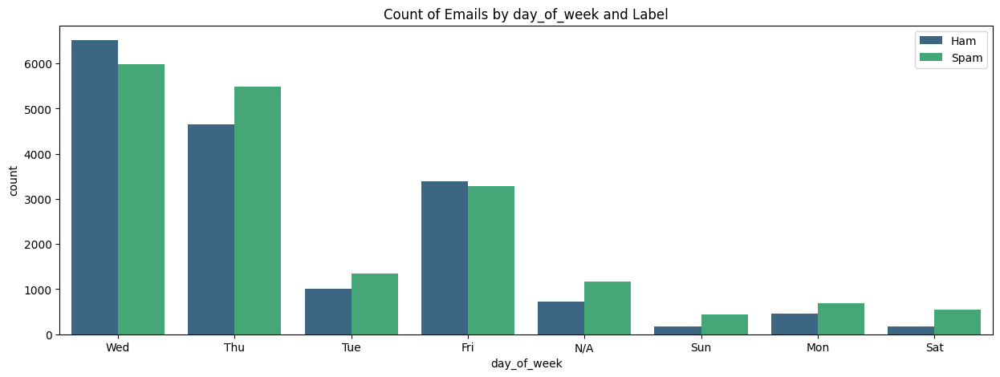

In [29]:
day_map = {
    0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 
    4: 'Fri', 5: 'Sat', 6: 'Sun', -1: 'N/A'
}

plt.figure(figsize=(15, 5))
sns.countplot(data=dfTrain, x=dfTrain['day_of_week'].map(day_map), hue='label', palette='viridis')
plt.title('Count of Emails by day_of_week and Label')
plt.legend(['Ham', 'Spam'])
plt.show()


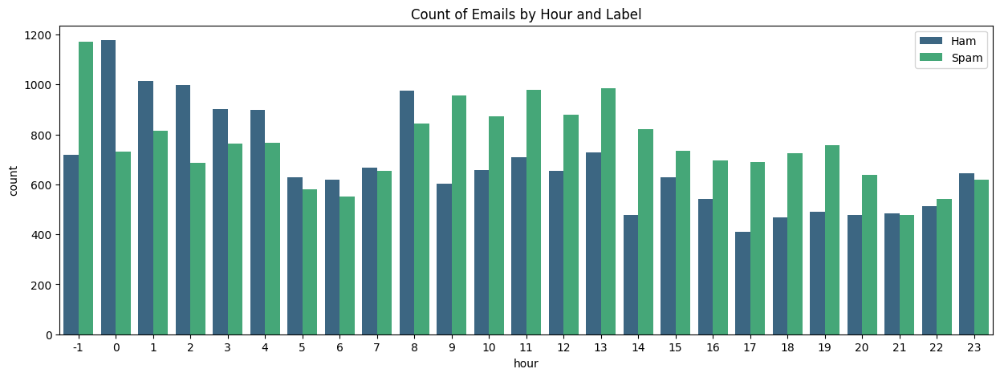

In [30]:
plt.figure(figsize=(15, 5))
sns.countplot(data=dfTrain, x=dfTrain['hour'], hue='label', palette='viridis')
plt.title(f'Count of Emails by Hour and Label')
plt.legend(['Ham', 'Spam'])
plt.show()

We observe that both the days and the time the message is sent are correlated with the message class.

Therefore, based on the analysis conducted, we will not retain the features:

- `exclamation_ratio`

- `has_money`

as they do not appear to correlate with the class of the messages. It is, however, highly important to also delete the `source` feature before training the models, since, as highlighted by the analysis above, the `nigerian_fraud` and `nazario` datasets contain only spam, and thus the algorithms are likely to learn to classify based on the label from the original datasets.